In [22]:
#import dependencies 
import os
import pandas as pd
import matplotlib.pyplot as plt
import hvplot.pandas

import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.decomposition import PCA

In [7]:
#combining csv files
folder_path = './data/'
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]
df_list = []  # Use a different name for the list

for csv_file in csv_files:
    csv_file_path = os.path.join(folder_path, csv_file)
    temp_df = pd.read_csv(csv_file_path)
    df_list.append(temp_df)

combined_df = pd.concat(df_list, ignore_index=True) 
combined_df.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
0,Lucky Man,Montgomery Gentry,spotify:track:4GiXBCUF7H6YfNQsnBRIzl,0.578,0.471,4,-7.270,1,0.0289,0.368000,0.00000,0.159,0.532,133.061,196707,4,30.88059,13,1
1,On The Hotline,Pretty Ricky,spotify:track:1zyqZONW985Cs4osz9wlsu,0.704,0.854,10,-5.477,0,0.1830,0.018500,0.00000,0.148,0.688,92.988,242587,4,41.51106,10,1
2,Clouds Of Dementia,Candlemass,spotify:track:6cHZf7RbxXCKwEkgAZT4mY,0.162,0.836,9,-3.009,1,0.0473,0.000111,0.00457,0.174,0.300,86.964,338893,4,65.32887,13,0
3,"Heavy Metal, Raise Hell!",Zwartketterij,spotify:track:2IjBPp2vMeX7LggzRN3iSX,0.188,0.994,4,-3.745,1,0.1660,0.000007,0.07840,0.192,0.333,148.440,255667,4,58.59528,9,0
4,I Got A Feelin',Billy Currington,spotify:track:1tF370eYXUcWwkIvaq3IGz,0.630,0.764,2,-4.353,1,0.0275,0.363000,0.00000,0.125,0.631,112.098,193760,4,22.62384,10,1


In [8]:
#rename columns
combined_df.rename(columns={'target':'Hit'}, inplace=True)
combined_df.rename(columns={'uri':'url'},inplace=True)
combined_df['url'] = combined_df['url'].apply(lambda x: f"https://open.spotify.com/track/{x.split(':')[-1]}")

In [9]:
#display data
combined_df.head()

,track,artist,url,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,Hit
0,Lucky Man,Montgomery Gentry,https://open.spotify.com/track/4GiXBCUF7H6YfNQ...,0.578,0.471,4,-7.270,1,0.0289,0.368000,0.00000,0.159,0.532,133.061,196707,4,30.88059,13,1
1,On The Hotline,Pretty Ricky,https://open.spotify.com/track/1zyqZONW985Cs4o...,0.704,0.854,10,-5.477,0,0.1830,0.018500,0.00000,0.148,0.688,92.988,242587,4,41.51106,10,1
2,Clouds Of Dementia,Candlemass,https://open.spotify.com/track/6cHZf7RbxXCKwEk...,0.162,0.836,9,-3.009,1,0.0473,0.000111,0.00457,0.174,0.300,86.964,338893,4,65.32887,13,0
3,"Heavy Metal, Raise Hell!",Zwartketterij,https://open.spotify.com/track/2IjBPp2vMeX7Lgg...,0.188,0.994,4,-3.745,1,0.1660,0.000007,0.07840,0.192,0.333,148.440,255667,4,58.59528,9,0
4,I Got A Feelin',Billy Currington,https://open.spotify.com/track/1tF370eYXUcWwkI...,0.630,0.764,2,-4.353,1,0.0275,0.363000,0.00000,0.125,0.631,112.098,193760,4,22.62384,10,1


In [20]:
combined_df.sort_values(by='loudness')

,track,artist,url,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,Hit
40576,Bar 641-655,Karlheinz Stockhausen,https://open.spotify.com/track/2ZdiZIN9iCyF809...,0.1260,0.000419,7,-49.253,1,0.0409,0.225000,0.000099,0.0972,0.1000,168.397,201960,3,19.58245,9,0
1887,Spiegel im Spiegel,Arvo Pärt,https://open.spotify.com/track/7e65IFpNYP1HAK4...,0.1150,0.002810,10,-47.327,1,0.0354,0.694000,0.000000,0.0480,0.0391,92.832,510067,3,31.08668,23,0
9146,Brown Noise Train,Track Circuit,https://open.spotify.com/track/0gF7MgxBQJIx042...,0.1510,0.149000,10,-46.655,0,0.0693,0.961000,0.970000,0.1000,0.0354,135.819,219880,3,77.62361,8,0
2082,In A Landscape,John Cage,https://open.spotify.com/track/3OzNi0pIuKw2Tis...,0.2080,0.006430,2,-44.347,0,0.0433,0.992000,0.935000,0.0849,0.4760,66.291,768173,4,81.05146,27,0
39790,The Ivanov Suite: II. The Scream,Roger Reynolds,https://open.spotify.com/track/2zFciSup9IY85fn...,0.0946,0.092500,11,-43.989,1,0.0481,0.214000,0.543000,0.3530,0.0375,83.502,194867,5,53.79520,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20950,Search and Destroy - Iggy Pop Mix,The Stooges,https://open.spotify.com/track/00sydAz6PeOxYzw...,0.2350,0.977000,6,0.878,1,0.1070,0.003530,0.006040,0.1720,0.2410,152.952,208133,4,19.04955,11,0
642,Dance of Lust,Freakshow,https://open.spotify.com/track/1ZlCP70vdRmQI4q...,0.4520,0.983000,2,1.137,0,0.0694,0.001360,0.000192,0.1330,0.5560,148.829,216880,4,52.53548,13,0
26981,Death Trip - Iggy Pop Mix,The Stooges,https://open.spotify.com/track/7bqn4e3nGorbHDg...,0.2280,0.998000,2,1.963,1,0.1530,0.006160,0.221000,0.0746,0.0768,155.804,367133,4,26.65973,17,0
23388,Like A Sunday Morning,Lana Cantrell,https://open.spotify.com/track/3jjBnB7v3HpQ0VD...,0.3630,0.884000,3,2.291,1,0.0375,0.104000,0.000000,0.1500,0.4760,81.470,189989,4,29.23695,9,1


In [10]:
#visualizing data
combined_df.hvplot()

:NdOverlay   [Variable]
   :Curve   [index]   (value)

              precision    recall  f1-score   support

           0       0.82      0.73      0.77      5155
           1       0.76      0.83      0.79      5122

    accuracy                           0.78     10277
   macro avg       0.79      0.78      0.78     10277
weighted avg       0.79      0.78      0.78     10277

Accuracy: 0.7833025201907171


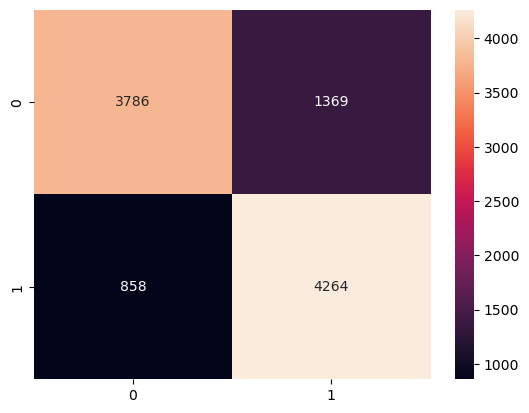

In [26]:
# Split your dataset into features (X) and target variable (y)
X = combined_df[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
                 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
                 'duration_ms', 'time_signature', 'chorus_hit', 'sections']]
y = combined_df['Hit']

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler to the training data and transform both training and testing data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the RandomForestClassifier
model = RandomForestClassifier(random_state=0)

# Train the model on scaled training data
model.fit(X_train_scaled, y_train)

# Make predictions on scaled testing data
y_pred = model.predict(X_test_scaled)

# Evaluate the model
cnf = confusion_matrix(y_test, y_pred)
sns.heatmap(cnf, annot=True, fmt='.0f')
print(classification_report(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))

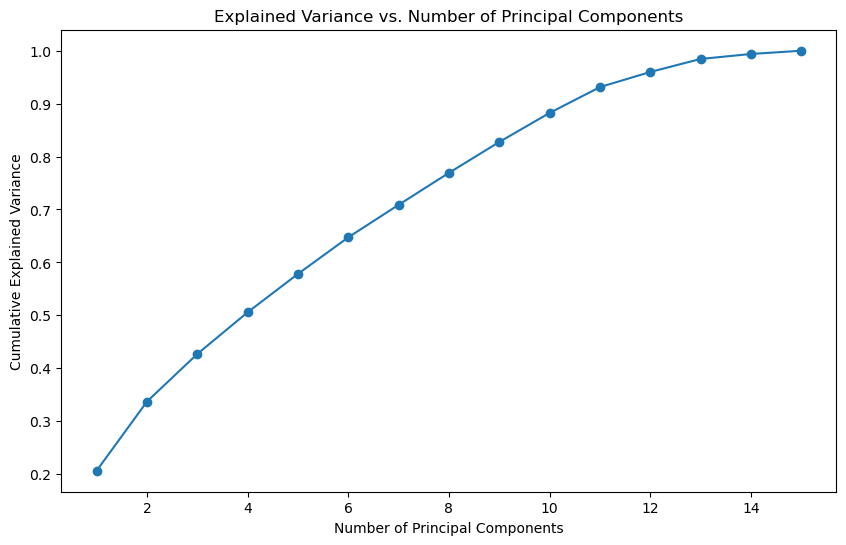

Number of components to explain 95% of variance: 12


In [27]:
pca = PCA()

# Fit PCA on the scaled training data
pca.fit(X_train_scaled)

# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_.cumsum(), marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs. Number of Principal Components')
plt.show()

# Find the number of components needed to explain a certain threshold of variance
cumulative_variance_threshold = 0.95  # Set your desired threshold
num_components = next(i for i, cum_var in enumerate(pca.explained_variance_ratio_.cumsum()) if cum_var >= cumulative_variance_threshold) + 1

print(f"Number of components to explain {cumulative_variance_threshold:.0%} of variance:", num_components)

# Perform PCA with the selected number of components
pca = PCA(n_components=num_components)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)